# Notebook wykorzystuje repozytorium [Grad-CAM](https://github.com/jacobgil/pytorch-grad-cam.git), dostępne na licencji MIT.

In [1]:
from torchvision.models import resnet18, ResNet18_Weights
from torch.utils.data import Dataset
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader
from tqdm import tqdm
import cv2
import torch
import numpy as np
import torch.nn as nn
import matplotlib.patches as patches

import matplotlib.pyplot as plt
from torchvision.datasets import Flowers102

In [2]:
class CustomDataset(Dataset):
    def __init__(self, base_dataset, split, sampler=None):
        self.base_dataset = base_dataset
        # self.sampler = sampler
        self.split = split
        self.augmentations = self._get_augmentations()

    def _get_augmentations(self):
        train_transforms = [
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.RandomHorizontalFlip(),
            transforms.RandomVerticalFlip(),
            transforms.RandomRotation(degrees=(-45, 45)),
            transforms.RandomApply([transforms.GaussianBlur(kernel_size=5)], p=0.5),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ]
        test_transforms = [
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ]

        if self.split == 'train':
            return transforms.Compose(train_transforms)
        else:
            return transforms.Compose(test_transforms)

    def __len__(self):
        return len(self.base_dataset)

    def __getitem__(self, idx):
        image, label = self.base_dataset[idx]
        image = self.augmentations(image)
        # x, coords = self.sampler(image)
        # return x, coords, label, image

        return image, label

In [38]:
base_train_dataset = Flowers102('Flowers102', split='train', download=True)
base_val_dataset = Flowers102('Flowers102', split='val', download=True)
flowers_train_dataset = CustomDataset(base_train_dataset, 'train')
flowers_valid_dataset = CustomDataset(base_val_dataset, 'val')

In [39]:
batch_size = 32  # Set an appropriate batch size
train_loader = DataLoader(flowers_train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(flowers_valid_dataset, batch_size=batch_size, shuffle=False)

In [40]:
model = resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
model.fc = nn.Linear(in_features = model.fc.in_features, out_features=102, bias=True)  # reset the classification head
model.fc

Linear(in_features=512, out_features=102, bias=True)

In [41]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# freeze all the previous parameters, only teach the new decision head
for p in model.parameters():
    p.requires_grad = False

model.fc.weight.requires_grad = True
model.fc.bias.requires_grad = True

In [42]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-2)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)
epochs = 30

for epoch in range(epochs):
    running_loss = 0.0
    model.train()
    train_correct = 0
    train_outputs = 0
    for i, data in enumerate(tqdm(train_loader), 0):
        images, labels = data
        labels, images = labels.to(device), images.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        train_correct += (torch.argmax(outputs, dim=-1) == labels).sum().item()
        train_outputs += outputs.shape[0]
        running_loss += loss
    scheduler.step()

    model.eval()
    total_correct = 0
    total_outputs = 0
    with torch.no_grad():
        for i, data in enumerate(tqdm(valid_loader), 0):
            images, labels = data
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            correct = (torch.argmax(outputs, dim=-1) == labels).sum().item()
            total_correct += correct
            total_outputs += outputs.shape[0]
    print(f"[Epoch {epoch + 1}] Loss: {running_loss / i:.3f}, Train Acc: {train_correct/train_outputs:.3f}, Valid Acc: {total_correct/total_outputs:.3f}")

100%|██████████| 32/32 [00:06<00:00,  5.06it/s]


[Epoch 1] Loss: 6.584, Train Acc: 0.117, Valid Acc: 0.349


100%|██████████| 32/32 [00:07<00:00,  4.43it/s]


[Epoch 2] Loss: 2.493, Train Acc: 0.482, Valid Acc: 0.467


100%|██████████| 32/32 [00:06<00:00,  5.02it/s]


[Epoch 3] Loss: 1.607, Train Acc: 0.644, Valid Acc: 0.508


100%|██████████| 32/32 [00:07<00:00,  4.43it/s]


[Epoch 4] Loss: 1.170, Train Acc: 0.727, Valid Acc: 0.596


100%|██████████| 32/32 [00:07<00:00,  4.35it/s]


[Epoch 5] Loss: 0.965, Train Acc: 0.774, Valid Acc: 0.612


100%|██████████| 32/32 [00:06<00:00,  4.91it/s]


[Epoch 6] Loss: 0.785, Train Acc: 0.792, Valid Acc: 0.647


100%|██████████| 32/32 [00:07<00:00,  4.36it/s]


[Epoch 7] Loss: 0.719, Train Acc: 0.810, Valid Acc: 0.663


100%|██████████| 32/32 [00:06<00:00,  4.94it/s]


[Epoch 8] Loss: 0.561, Train Acc: 0.840, Valid Acc: 0.637


100%|██████████| 32/32 [00:07<00:00,  4.34it/s]


[Epoch 9] Loss: 0.688, Train Acc: 0.810, Valid Acc: 0.639


100%|██████████| 32/32 [00:06<00:00,  5.10it/s]


[Epoch 10] Loss: 0.733, Train Acc: 0.815, Valid Acc: 0.624


100%|██████████| 32/32 [00:06<00:00,  4.57it/s]


[Epoch 11] Loss: 0.396, Train Acc: 0.900, Valid Acc: 0.733


100%|██████████| 32/32 [00:07<00:00,  4.41it/s]


[Epoch 12] Loss: 0.169, Train Acc: 0.957, Valid Acc: 0.743


100%|██████████| 32/32 [00:06<00:00,  5.05it/s]


[Epoch 13] Loss: 0.142, Train Acc: 0.965, Valid Acc: 0.733


100%|██████████| 32/32 [00:07<00:00,  4.49it/s]


[Epoch 14] Loss: 0.168, Train Acc: 0.955, Valid Acc: 0.744


100%|██████████| 32/32 [00:06<00:00,  5.04it/s]


[Epoch 15] Loss: 0.134, Train Acc: 0.971, Valid Acc: 0.751


100%|██████████| 32/32 [00:07<00:00,  4.55it/s]


[Epoch 16] Loss: 0.151, Train Acc: 0.962, Valid Acc: 0.759


100%|██████████| 32/32 [00:07<00:00,  4.50it/s]


[Epoch 17] Loss: 0.154, Train Acc: 0.961, Valid Acc: 0.755


100%|██████████| 32/32 [00:06<00:00,  4.97it/s]


[Epoch 18] Loss: 0.139, Train Acc: 0.964, Valid Acc: 0.756


100%|██████████| 32/32 [00:07<00:00,  4.37it/s]


[Epoch 19] Loss: 0.177, Train Acc: 0.956, Valid Acc: 0.746


100%|██████████| 32/32 [00:06<00:00,  5.00it/s]


[Epoch 20] Loss: 0.137, Train Acc: 0.964, Valid Acc: 0.751


100%|██████████| 32/32 [00:07<00:00,  4.38it/s]


[Epoch 21] Loss: 0.126, Train Acc: 0.973, Valid Acc: 0.747


100%|██████████| 32/32 [00:06<00:00,  4.65it/s]


[Epoch 22] Loss: 0.114, Train Acc: 0.973, Valid Acc: 0.756


100%|██████████| 32/32 [00:06<00:00,  5.00it/s]


[Epoch 23] Loss: 0.140, Train Acc: 0.967, Valid Acc: 0.762


100%|██████████| 32/32 [00:07<00:00,  4.44it/s]


[Epoch 24] Loss: 0.122, Train Acc: 0.971, Valid Acc: 0.764


100%|██████████| 32/32 [00:07<00:00,  4.05it/s]


[Epoch 25] Loss: 0.123, Train Acc: 0.971, Valid Acc: 0.760


100%|██████████| 32/32 [00:07<00:00,  4.42it/s]


[Epoch 26] Loss: 0.149, Train Acc: 0.955, Valid Acc: 0.761


100%|██████████| 32/32 [00:06<00:00,  4.97it/s]


[Epoch 27] Loss: 0.117, Train Acc: 0.968, Valid Acc: 0.767


100%|██████████| 32/32 [00:07<00:00,  4.40it/s]


[Epoch 28] Loss: 0.123, Train Acc: 0.970, Valid Acc: 0.762


100%|██████████| 32/32 [00:06<00:00,  4.94it/s]


[Epoch 29] Loss: 0.109, Train Acc: 0.978, Valid Acc: 0.761


100%|██████████| 32/32 [00:06<00:00,  4.65it/s]

[Epoch 30] Loss: 0.111, Train Acc: 0.976, Valid Acc: 0.767


In [ ]:
# !git clone https://github.com/jacobgil/pytorch-grad-cam.git

In [43]:
!pip install -q grad-cam  # -q --> quiet

In [44]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import (
    show_cam_on_image, deprocess_image, preprocess_image
)

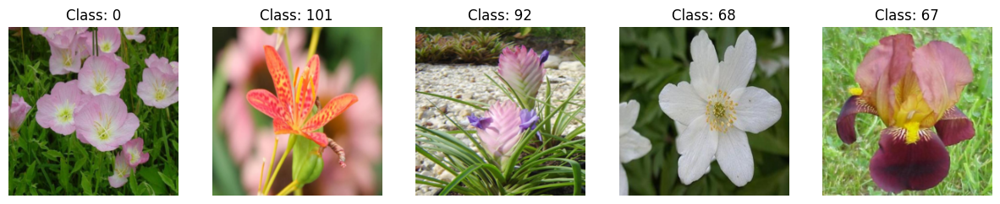

In [45]:
transform = torchvision.transforms.Compose([transforms.Resize((224, 224)),
                                            transforms.PILToTensor()],)

batch_size = 5  # Set an appropriate batch size
base_train_dataset = Flowers102('Flowers102', split='train', download=True, transform=transform)
train_loader = DataLoader(base_train_dataset, batch_size=batch_size, shuffle=True)

for imgs, labels in train_loader:
    break

fig, ax = plt.subplots(1, 5, figsize=(15,10))

for i in range(batch_size):
    img = (imgs[i] / 255).squeeze(0)
    img = np.transpose(img.numpy(), (1, 2, 0))
    ax[i].imshow(img)
    ax[i].set_title(f"Class: {int(labels[i])}")
    ax[i].axis('off')
plt.show()

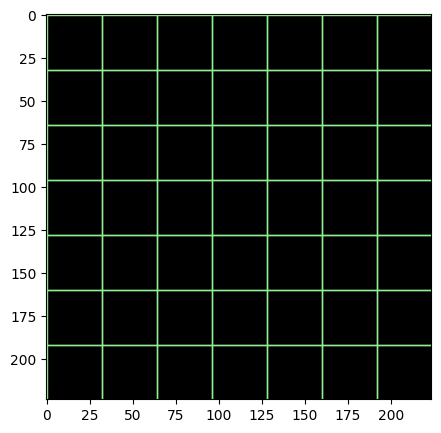

In [46]:
def get_rectangles(x: int, y: int, w: int, h: int, size: tuple=(16,16), color: str='lightgreen') -> list:
    list_of_rectangles = []

    for i in range(w // size[0]):
        for j in range(h // size[1]):
            x_temp, y_temp = x + i*size[0], y + j*size[1]
            w_temp, h_temp = size
            list_of_rectangles.append(patches.Rectangle((x_temp, y_temp), w_temp, h_temp, fill=False, color=color, linewidth=1))
    return list_of_rectangles


fig, ax = plt.subplots(1, 1, figsize=(5,5))

ax.imshow(np.zeros(shape=(224,224)), cmap='gray')
rectangles = get_rectangles(0, 0, 224, 224, size=(32,32))
for rectangle in rectangles:
    ax.add_patch(rectangle)
plt.show()


# Wizualizacja metody dla mniejszych patchy rozmiaru 8x8, wiekszych rozmiaru 32x32

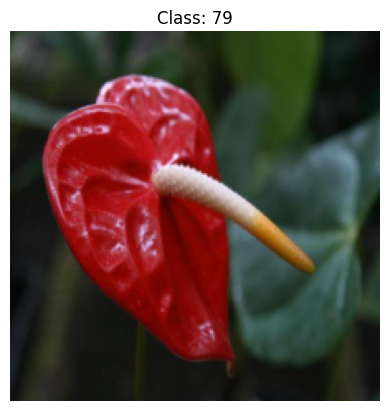

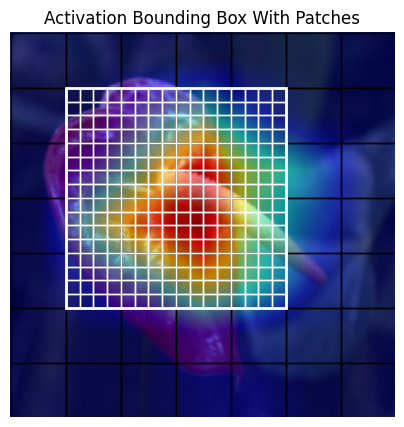

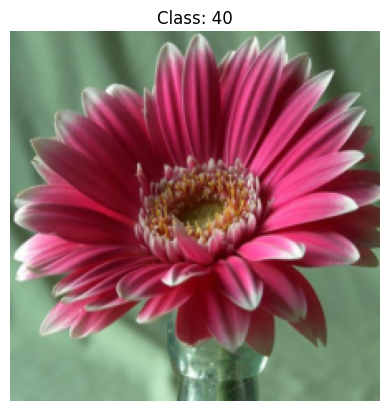

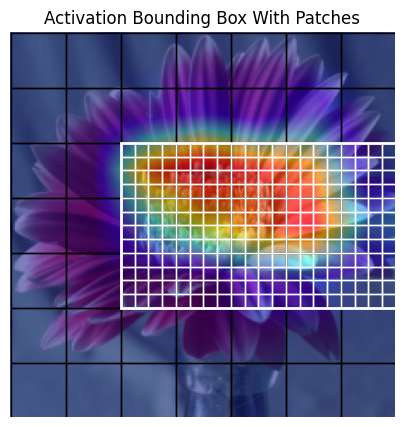

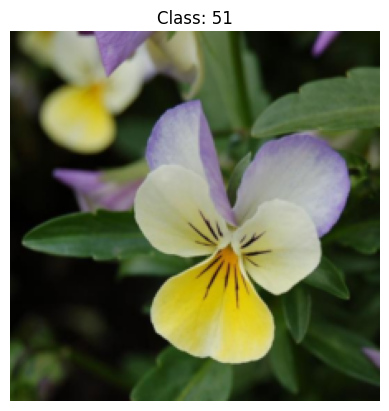

...

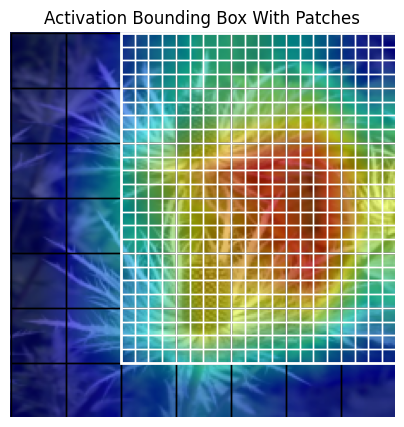

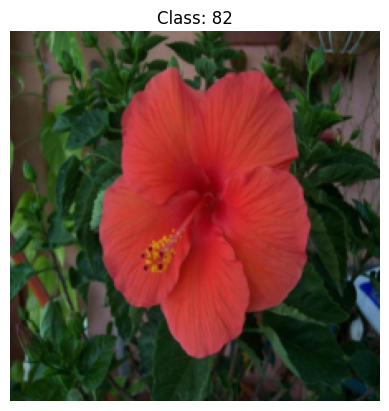

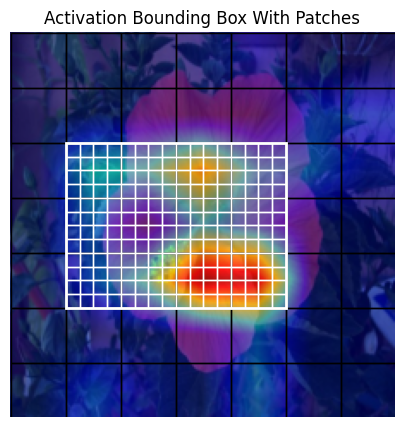

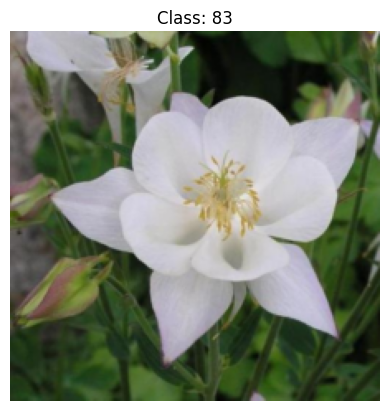

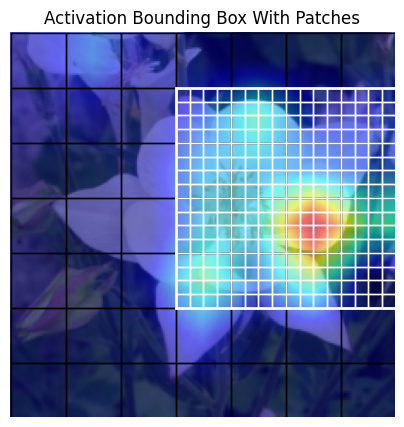

In [74]:
torch.manual_seed(20)

# unfreeze all the parameters
for p in model.parameters():
    p.requires_grad = True

target_layers = [model.layer4]
patch_size = (8, 8)
bigger_grid_patch_size = (32, 32)


transform = torchvision.transforms.Compose([transforms.Resize((224, 224)),
                                            transforms.PILToTensor()],)

base_test_dataset = Flowers102('Flowers102', split='test', download=True, transform=transform)
batch_size = 10  # Set an appropriate batch size
test_loader = DataLoader(base_test_dataset, batch_size=batch_size, shuffle=True)

for img, label in test_loader:
    break


for i in range(batch_size):

  rgb_img = (img[i] / 255).squeeze(0)
  rgb_img = np.transpose(rgb_img.numpy(), (1, 2, 0))

  input_tensor = preprocess_image(rgb_img,
                                  mean=[0.485, 0.456, 0.406],
                                  std=[0.229, 0.224, 0.225])

  # Construct the CAM object once, and then re-use it on many images:
  cam = GradCAM(model=model, target_layers=target_layers, use_cuda=(device.type=='cuda'))
  cam.batch_size = 1

  output = model(input_tensor.to(device))
  pred_label = torch.argmax(output, dim=-1).item()

  # targets = [ClassifierOutputTarget(label[i].item())]  # When we know the label --> during training
  targets = None  # When we don't have the label --> during validation and testing --> will take the label from argmax

  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=input_tensor,
                              targets=targets)

  # In this example grayscale_cam has only one image in the batch:
  grayscale_cam = grayscale_cam[0, :]
  visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)


  plt.imshow(rgb_img)
  plt.title(f"Class: {int(label[i])}")
  plt.axis('off')
  plt.show()


  gray = (grayscale_cam * 255).astype("uint8")
  thresh = cv2.threshold(gray, 75, 255, cv2.THRESH_BINARY)[1]

  # Find contours
  cnts = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnts = cnts[0] if len(cnts) == 2 else cnts[1]

  fig, ax = plt.subplots(1,1, figsize=(5,5))
  ax.imshow(visualization)

  if len(cnts) == 0:
      x,y,w,h = 0, 0, 224, 224
      ax.add_patch(patches.Rectangle((1, 1), w-4, h-4, fill=False, color='white', linewidth=3))
      rectangles = get_rectangles(0, 0, 224, 224, size=bigger_grid_patch_size, color='white')
      for rectangle in rectangles:
          ax.add_patch(rectangle)
      # print(f"Rectangle's left upper corner coords: (X,Y)=({x},{y}), size {w}x{h}")

  else:
      _rectangles = get_rectangles(0, 0, 224, 224, size=bigger_grid_patch_size, color='black')
      for _rectangle in _rectangles:
          ax.add_patch(_rectangle)
      for c in cnts:
          x,y,w,h = cv2.boundingRect(c)

          # we do not care about small bounding-boxes
          if (w, h) < (16, 16):
              continue

          if bigger_grid_patch_size[0] - x % bigger_grid_patch_size[0] >= x % bigger_grid_patch_size[0]:
              x = x - x % bigger_grid_patch_size[0]
          else:
              x = x + (bigger_grid_patch_size[0] - x % bigger_grid_patch_size[0])

          if bigger_grid_patch_size[1] - y % bigger_grid_patch_size[1] >= y % bigger_grid_patch_size[1]:
              y = y - y % bigger_grid_patch_size[1]
          else:
              y = y + (bigger_grid_patch_size[1] - y % bigger_grid_patch_size[1])


          if bigger_grid_patch_size[0] - w % bigger_grid_patch_size[0] >= w % bigger_grid_patch_size[0]:
              w = w - w % bigger_grid_patch_size[0]
          else:
              w = w + (bigger_grid_patch_size[0] - w % bigger_grid_patch_size[0])

          if bigger_grid_patch_size[1] - h % bigger_grid_patch_size[1] >= h % bigger_grid_patch_size[1]:
              h = h - h % bigger_grid_patch_size[1]
          else:
              h = h + (bigger_grid_patch_size[1] - h % bigger_grid_patch_size[1])


          ax.add_patch(patches.Rectangle((x, y), w, h, fill=False, color='white', linewidth=2))
          rectangles = get_rectangles(x, y, w, h, size=patch_size, color='white')
          for rectangle in rectangles:
              ax.add_patch(rectangle)
          # print(f"Rectangle's left upper corner coords: (X,Y)=({x},{y}), size {w}x{h}")

  ax.set_title('Activation Bounding Box With Patches')
  ax.axis('off')
  plt.show()

# To samo, teraz dla rozmiaru mniejszych patchy 14x14, większych 56x56

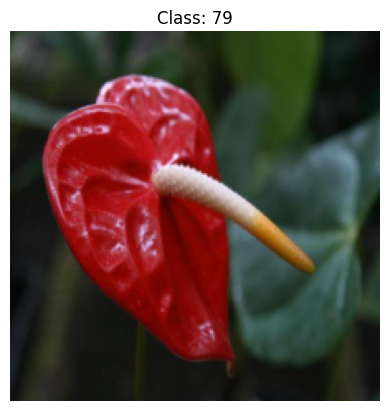

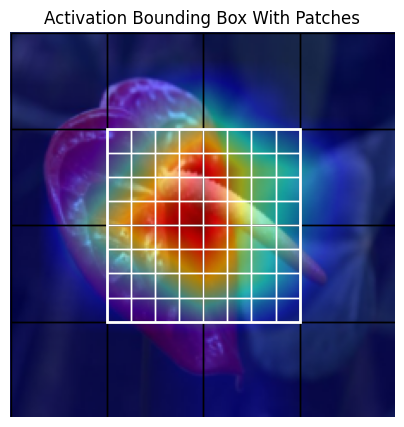

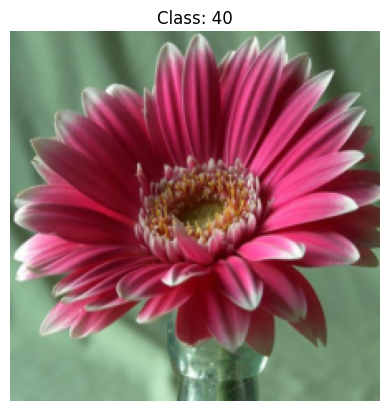

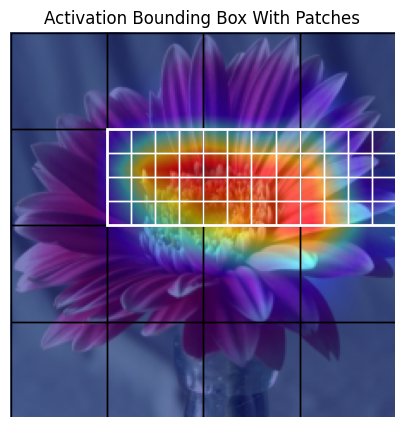

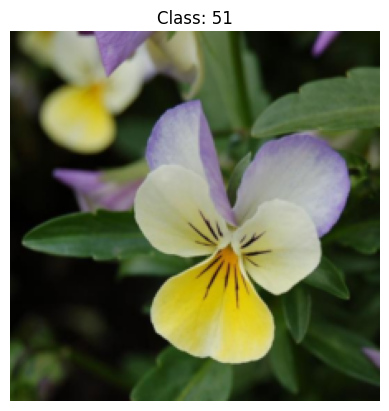

...

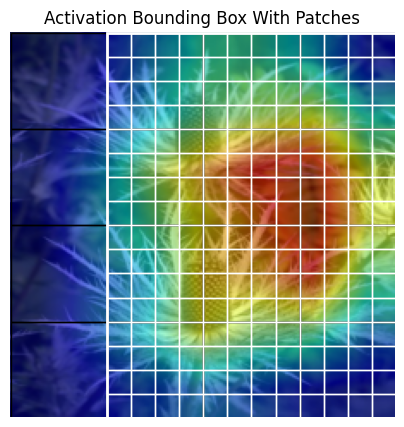

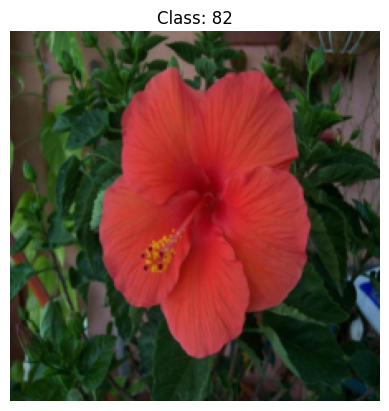

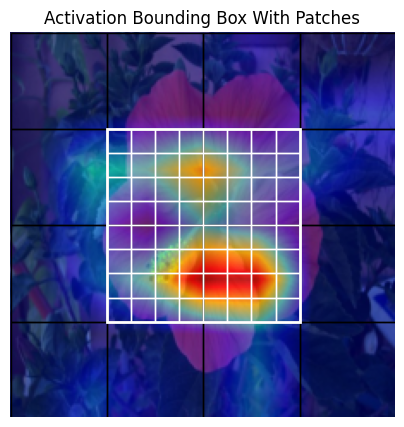

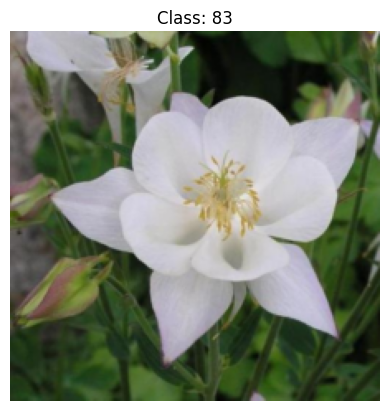

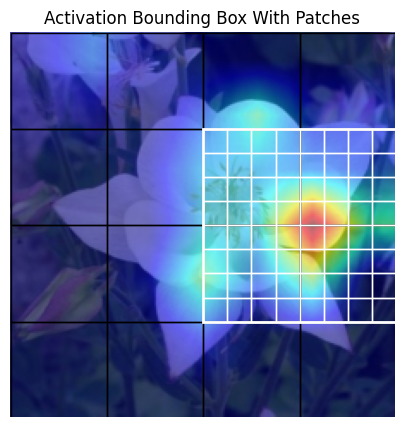

In [78]:
torch.manual_seed(20)

# unfreeze all the parameters
for p in model.parameters():
    p.requires_grad = True

target_layers = [model.layer4]
patch_size = (14,14)
bigger_grid_patch_size = (56, 56)


transform = torchvision.transforms.Compose([transforms.Resize((224, 224)),
                                            transforms.PILToTensor()],)

base_test_dataset = Flowers102('Flowers102', split='test', download=True, transform=transform)
batch_size = 10  # Set an appropriate batch size
test_loader = DataLoader(base_test_dataset, batch_size=batch_size, shuffle=True)

for img, label in test_loader:
    break


for i in range(batch_size):

  rgb_img = (img[i] / 255).squeeze(0)
  rgb_img = np.transpose(rgb_img.numpy(), (1, 2, 0))

  input_tensor = preprocess_image(rgb_img,
                                  mean=[0.485, 0.456, 0.406],
                                  std=[0.229, 0.224, 0.225])

  # Construct the CAM object once, and then re-use it on many images:
  cam = GradCAM(model=model, target_layers=target_layers, use_cuda=(device.type=='cuda'))
  cam.batch_size = 1

  output = model(input_tensor.to(device))
  pred_label = torch.argmax(output, dim=-1).item()

  # targets = [ClassifierOutputTarget(label[i].item())]  # When we know the label --> during training
  targets = None  # When we don't have the label --> during validation and testing --> will take the label from argmax

  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=input_tensor,
                              targets=targets)

  # In this example grayscale_cam has only one image in the batch:
  grayscale_cam = grayscale_cam[0, :]
  visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)


  plt.imshow(rgb_img)
  plt.title(f"Class: {int(label[i])}")
  plt.axis('off')
  plt.show()


  gray = (grayscale_cam * 255).astype("uint8")
  thresh = cv2.threshold(gray, 75, 255, cv2.THRESH_BINARY)[1]

  # Find contours
  cnts = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnts = cnts[0] if len(cnts) == 2 else cnts[1]

  fig, ax = plt.subplots(1,1, figsize=(5,5))
  ax.imshow(visualization)

  if len(cnts) == 0:
      x,y,w,h = 0, 0, 224, 224
      ax.add_patch(patches.Rectangle((1, 1), w-4, h-4, fill=False, color='white', linewidth=3))
      rectangles = get_rectangles(0, 0, 224, 224, size=bigger_grid_patch_size, color='white')
      for rectangle in rectangles:
          ax.add_patch(rectangle)
      # print(f"Rectangle's left upper corner coords: (X,Y)=({x},{y}), size {w}x{h}")

  else:
      _rectangles = get_rectangles(0, 0, 224, 224, size=bigger_grid_patch_size, color='black')
      for _rectangle in _rectangles:
          ax.add_patch(_rectangle)
      for c in cnts:
          x,y,w,h = cv2.boundingRect(c)

          # we do not care about small bounding-boxes
          if (w, h) < (16, 16):
              continue

          if bigger_grid_patch_size[0] - x % bigger_grid_patch_size[0] >= x % bigger_grid_patch_size[0]:
              x = x - x % bigger_grid_patch_size[0]
          else:
              x = x + (bigger_grid_patch_size[0] - x % bigger_grid_patch_size[0])

          if bigger_grid_patch_size[1] - y % bigger_grid_patch_size[1] >= y % bigger_grid_patch_size[1]:
              y = y - y % bigger_grid_patch_size[1]
          else:
              y = y + (bigger_grid_patch_size[1] - y % bigger_grid_patch_size[1])


          if bigger_grid_patch_size[0] - w % bigger_grid_patch_size[0] >= w % bigger_grid_patch_size[0]:
              w = w - w % bigger_grid_patch_size[0]
          else:
              w = w + (bigger_grid_patch_size[0] - w % bigger_grid_patch_size[0])

          if bigger_grid_patch_size[1] - h % bigger_grid_patch_size[1] >= h % bigger_grid_patch_size[1]:
              h = h - h % bigger_grid_patch_size[1]
          else:
              h = h + (bigger_grid_patch_size[1] - h % bigger_grid_patch_size[1])


          ax.add_patch(patches.Rectangle((x, y), w, h, fill=False, color='white', linewidth=2))
          rectangles = get_rectangles(x, y, w, h, size=patch_size, color='white')
          for rectangle in rectangles:
              ax.add_patch(rectangle)
          # print(f"Rectangle's left upper corner coords: (X,Y)=({x},{y}), size {w}x{h}")

  ax.set_title('Activation Bounding Box With Patches')
  ax.axis('off')
  plt.show()